# Empirical Cumulative Distribution Functions for Outlier Detection: (ECOD) Algorithm in Details

In [21]:
import os
import sys
from pathlib import Path
import numpy as np
import pandas as pd

from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, roc_auc_score, precision_recall_curve, auc
from pyod.models.ecod import ECOD
import matplotlib.pyplot as plt
import seaborn as sns

from pyod.models.ecod import ECOD
from pyod.utils.data import generate_data
from pyod.utils.data import evaluate_print
from pyod.utils.example import visualize

# Configuration

DATA_DIR = Path(r"../../datasets/").resolve()
CARDIO_DATA_PATH = DATA_DIR.joinpath("Classical/6_cardio.npz")


# ================= load dataset ===============================
cardio = np.load(CARDIO_DATA_PATH, allow_pickle=True)
X, y = cardio['X'], cardio['y']


labels = y
features = X

In this notebook we will go over the ECOD algorithm in details, how it works, where it shines and we will explain it using generated data and apply it to a set of datasets:


On Training Data:
ECOD ROC:0.9562, precision @ rank n:0.65

On Test Data:
ECOD ROC:0.935, precision @ rank n:0.4


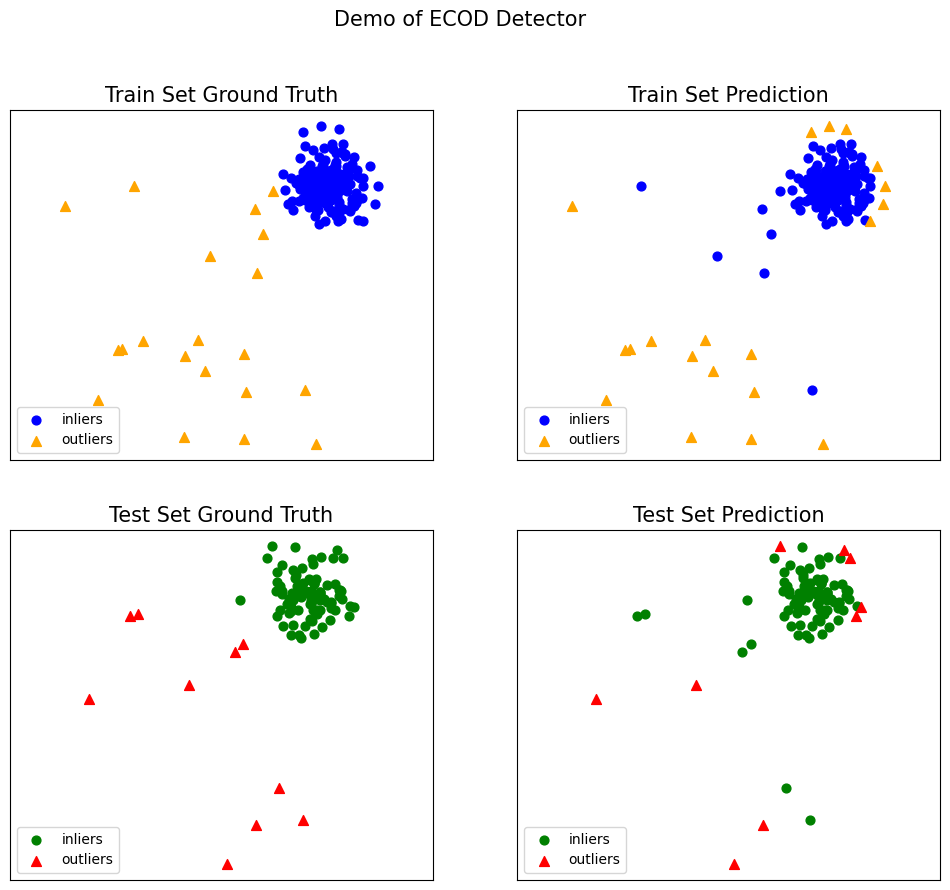

In [3]:
if __name__ == "__main__":
    contamination = 0.1                        # percentage of outliers
    n_train = 200                              # number of training points
    n_test = 100                               # number of testing points

    # Generate sample data
    X_train, X_test, y_train, y_test = \
        generate_data(n_train=n_train,
                      n_test=n_test,
                      n_features=2,
                      contamination=contamination,
                      random_state=42)

    # train ECOD detector
    clf_name = 'ECOD'
    clf = ECOD()

    # you could try parallel version as well.
    # clf = ECOD(n_jobs=2)
    clf.fit(X_train)

    # get the prediction labels and outlier scores of the training data
    y_train_pred = clf.labels_                                           # binary labels (0: inliers, 1: outliers)
    y_train_scores = clf.decision_scores_                                # raw outlier scores

    # get the prediction on the test data
    y_test_pred = clf.predict(X_test)  # outlier labels (0 or 1)
    y_test_scores = clf.decision_function(X_test)  # outlier scores

    # evaluate and print the results
    print("\nOn Training Data:")
    evaluate_print(clf_name, y_train, y_train_scores)
    print("\nOn Test Data:")
    evaluate_print(clf_name, y_test, y_test_scores)

    # visualize the results
    visualize(clf_name, X_train, y_train, X_test, y_test, y_train_pred,
              y_test_pred, show_figure=True, save_figure=False)

In [4]:


# Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [5]:
# Initialize the ECOD model
ecod = ECOD()

# Fit the model to the scaled data
ecod.fit(X_scaled)

# Predict the outliers
y_pred = ecod.labels_                 # binary labels (0: inliers, 1: outliers)
y_scores = ecod.decision_scores_      # raw outlier scores

# Print the number of outliers detected
print(f"Number of outliers detected: {sum(y_pred)}")

Number of outliers detected: 183


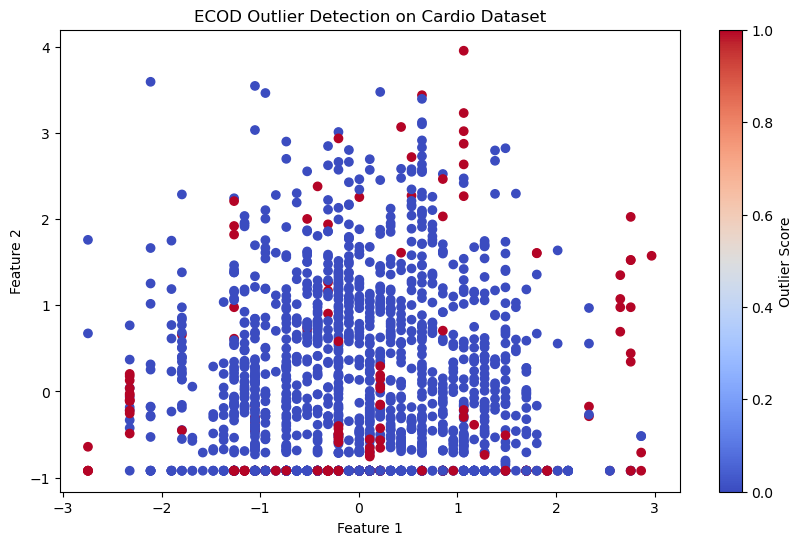

In [6]:
import matplotlib.pyplot as plt

# Scatter plot for the first two features with outliers highlighted
plt.figure(figsize=(10, 6))
plt.scatter(X_scaled[:, 0], X_scaled[:, 1], c=y_pred, cmap='coolwarm', marker='o')
plt.title("ECOD Outlier Detection on Cardio Dataset")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.colorbar(label="Outlier Score")
plt.show()


Number of outliers detected: 183 out of 1831 total samples.

Classification Report:
              precision    recall  f1-score   support

      Inlier       0.95      0.95      0.95      1655
     Outlier       0.51      0.53      0.52       176

    accuracy                           0.91      1831
   macro avg       0.73      0.74      0.73      1831
weighted avg       0.91      0.91      0.91      1831

ROC AUC Score: 0.9350
Precision-Recall AUC: 0.5658


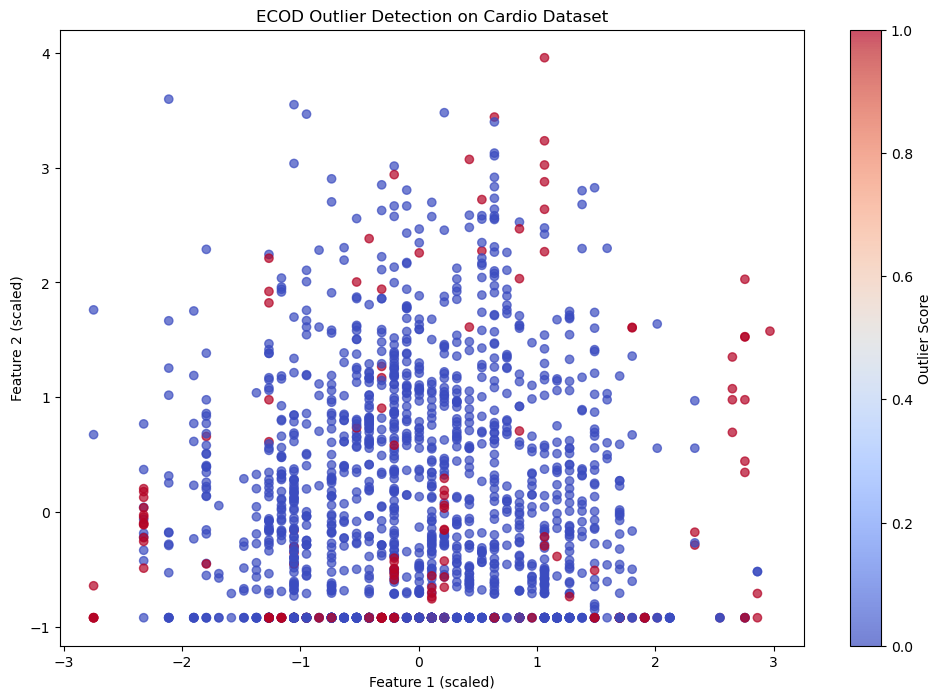

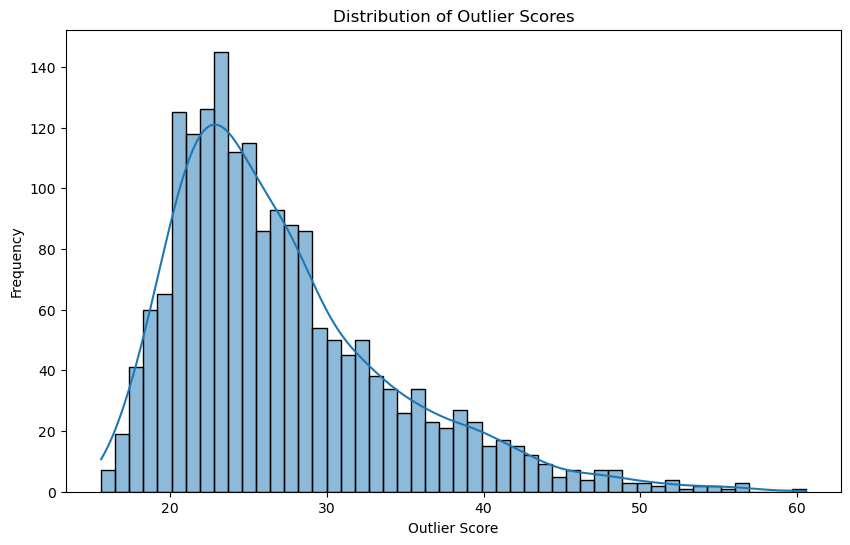


Sample Outlier Data Points:
[[ 4.91231466e-03 -9.19988437e-01  1.87898207e+00 -1.63587114e+00
   3.26817125e+00 -6.14006445e-02 -2.78294946e-01 -1.11201523e+00
   5.27574651e+00 -4.20487348e-01 -5.47012405e-01  1.83016557e+00
  -1.43984137e+00  1.57972063e+00  1.99865689e+00 -4.88278885e-01
  -1.79460262e-01 -1.27539257e+00 -1.35474890e+00  2.28203994e+00
  -4.93293969e-01]
 [ 4.91231466e-03 -9.19988437e-01  2.06462367e+00 -1.05248575e+00
   2.56944300e+00 -6.14006445e-02 -2.78294946e-01 -1.11201523e+00
   3.53856418e+00 -4.20487348e-01  7.29600874e-01  1.98902371e+00
  -1.43984137e+00  1.90972901e+00  1.65465042e+00 -4.88278885e-01
  -1.79460262e-01 -8.28455956e-01 -7.34043613e-01  1.17982893e+00
  -4.93293969e-01]
 [ 4.91231466e-03 -9.19988437e-01  2.15545486e+00 -1.49725760e-01
   3.92026922e+00 -6.14006445e-02 -2.78294946e-01 -1.35131709e+00
   6.31805591e+00 -4.20487348e-01 -3.25732770e-01  1.98902371e+00
  -1.43984137e+00  1.90972901e+00  1.99865689e+00 -4.88278885e-01
  -7.8061

<Figure size 1200x800 with 0 Axes>

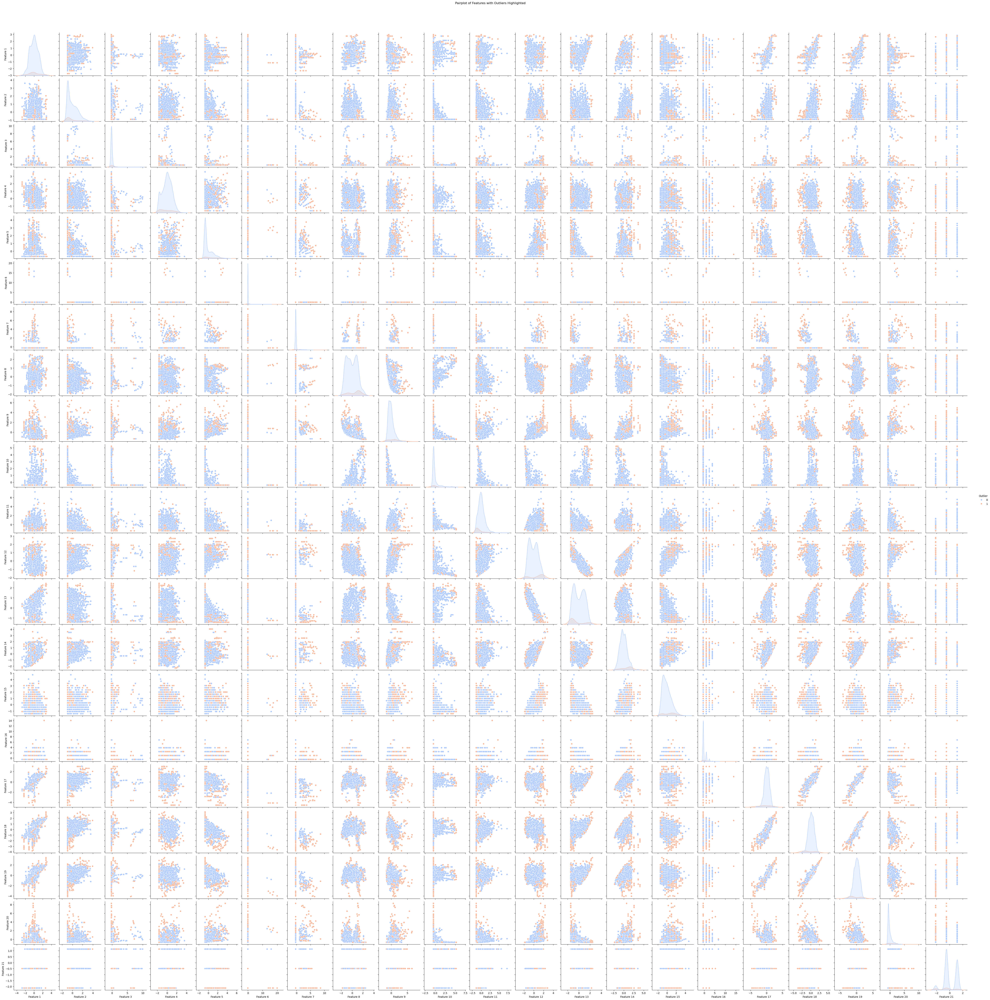

In [23]:
# Scale features using StandardScaler
scaler = StandardScaler()
features_scaled = scaler.fit_transform(X)

# Initialize the ECOD model
ecod_model = ECOD(contamination=0.1)                # Set contamination to estimate outliers
ecod_model.fit(features_scaled)

# Predict the outliers
outlier_labels = ecod_model.labels_                  # 0 for inliers, 1 for outliers
outlier_scores = ecod_model.decision_scores_

# Print the number of outliers detected
num_outliers = np.sum(outlier_labels)
print(f"\nNumber of outliers detected: {num_outliers} out of {len(outlier_labels)} total samples.")

# Evaluate the model if labels are available
if labels is not None:
    print("\nClassification Report:")
    print(classification_report(y, outlier_labels, target_names=['Inlier', 'Outlier']))
    roc_auc = roc_auc_score(labels, outlier_scores)
    print(f"ROC AUC Score: {roc_auc:.4f}")
    
    precision, recall, _ = precision_recall_curve(labels, outlier_scores)
    pr_auc = auc(recall, precision)
    print(f"Precision-Recall AUC: {pr_auc:.4f}")


# Visualize outliers using a scatter plot for the first two features
plt.figure(figsize=(12, 8))
plt.scatter(features_scaled[:, 0], features_scaled[:, 1], c=outlier_labels, cmap='coolwarm', alpha=0.7)
plt.title("ECOD Outlier Detection on Cardio Dataset")
plt.xlabel("Feature 1 (scaled)")
plt.ylabel("Feature 2 (scaled)")
plt.colorbar(label="Outlier Score")
plt.show()

# Visualize outlier scores distribution
plt.figure(figsize=(10, 6))
sns.histplot(outlier_scores, bins=50, kde=True)
plt.title("Distribution of Outlier Scores")
plt.xlabel("Outlier Score")
plt.ylabel("Frequency")
plt.show()


# Analyze specific outliers
outlier_indices = np.where(outlier_labels == 1)[0]
print("\nSample Outlier Data Points:")
print(X[outlier_indices][:5])

# Visualize outliers against more features
if features_scaled.shape[1] > 2:
    features_df = pd.DataFrame(features_scaled, columns=[f'Feature {i+1}' for i in range(features_scaled.shape[1])])
    
    # Add the outlier labels to the DataFrame
    features_df['Outlier'] = outlier_labels

    # Create the pairplot
    plt.figure(figsize=(12, 8))
    sns.pairplot(data=features_df, hue='Outlier', palette='coolwarm', diag_kind='kde')
    plt.suptitle("Pairplot of Features with Outliers Highlighted", y=1.02)
    plt.show()